# CSCA 5632 Unsupervised Algorithms in Machine Learning Final Project

## 1. Introduction

In this project, we aim to identify and segment objects in images using unsupervised learning methods. We will use the SLIC (Simple Linear Iterative Clustering) superpixel segmentation as our primary unsupervised approaches. We have access to labeled polygon annotations, allowing us to use Intersection over Union (IOU) to evaluate the accuracy of our segmentation algorithms.

## 2. Data Collection and EDA

### 2.1 Data Collection

We will use the COCO (Common Objects in Context) dataset for our project, which provides a rich set of labeled images. The total size of train dataset is 18GB. So we will randomly pick some of them in further implementation.

The reference of COCO data is as following:
    
    COCO-Stuff: Thing and Stuff Classes in Context
    H. Caesar, J. Uijlings, V. Ferrari,
    In Computer Vision and Pattern Recognition (CVPR), 2018.

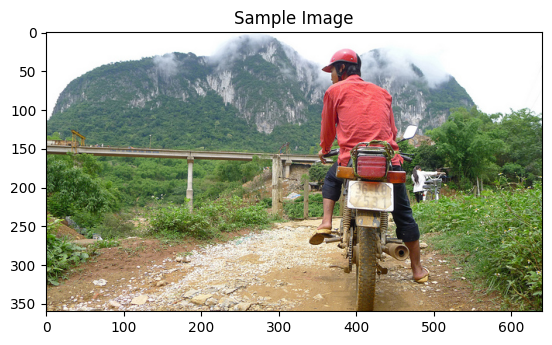

In [11]:
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
from pycocotools.coco import COCO

# Load the dataset
coco = COCO('data/annotations/instances_train2017.json')
image_ids = coco.getImgIds()
images = coco.loadImgs(image_ids)

# Display a sample image
image_sample = images[0]
image_path = 'data/train2017/' + image_sample['file_name']
image = cv2.imread(image_path)

plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Sample Image')
plt.show()

### 2.2 Identify an Unsupervised Learning Problem

In this project, we aim to solve an image segmentation problem using unsupervised learning methods. Image segmentation involves dividing an image into meaningful segments, such as objects or background.


Problem Description:

We will use two unsupervised learning techniques:

1) SLIC Superpixel Segmentation: Clusters pixels based on color and spatial proximity to create superpixels.
2) Kmeans: Cluster images using the most close pixels.


Goals:

1) Implement and compare SLIC and Kmeans for image segmentation.
2) Evaluate and improve segmentation accuracy using IOU.
3) This project will demonstrate the effectiveness of unsupervised learning techniques for image segmentation, leveraging the COCO dataset for comprehensive analysis and evaluation.

### 2.3 Exploratory Data Analysis (EDA) & Data Cleaning
1) Describe the Categories
We will describe the categories that make up the dataset and visualize their distribution using appropriate plots.

In [25]:
# Load categories
categories = coco.loadCats(coco.getCatIds())
category_names = [cat['name'] for cat in categories]

# Display category names and counts
category_counts = coco.getCatIds()
print(f'Categories: {category_names}')
print(f'Number of categories: {len(category_counts)}')

Categories: ['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush']
Number of categories: 80


2) Visualize Category Distribution
We will create a bar plot to visualize the distribution of different categories in the dataset.

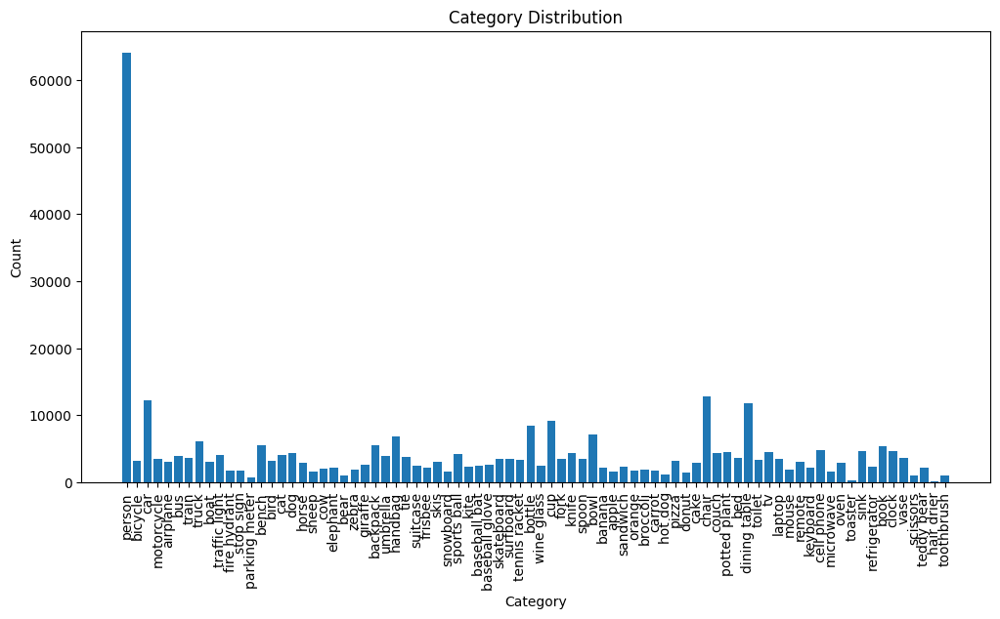

In [13]:
# Count the number of instances per category
category_counts = {}
for cat in categories:
    category_counts[cat['name']] = len(coco.getImgIds(catIds=cat['id']))

# Plot category distribution
plt.figure(figsize=(12, 6))
plt.bar(category_counts.keys(), category_counts.values())
plt.xticks(rotation=90)
plt.title('Category Distribution')
plt.xlabel('Category')
plt.ylabel('Count')
plt.show()

3) Size analysis
We will describe correlations between different features of the dataset and justify whether they are correlated or not using numerical or graphical analysis.

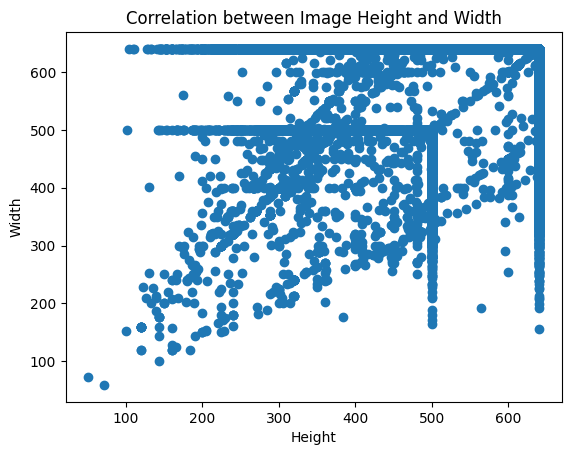

Correlation coefficient between image height and width: -0.41932266210217334


In [14]:
# Example: Correlation between image height and width
heights = [img['height'] for img in images]
widths = [img['width'] for img in images]

# Scatter plot to visualize correlation
plt.scatter(heights, widths)
plt.title('Correlation between Image Height and Width')
plt.xlabel('Height')
plt.ylabel('Width')
plt.show()

# Calculate the correlation coefficient
correlation = np.corrcoef(heights, widths)[0, 1]
print(f'Correlation coefficient between image height and width: {correlation}')


4) Annotation inspection

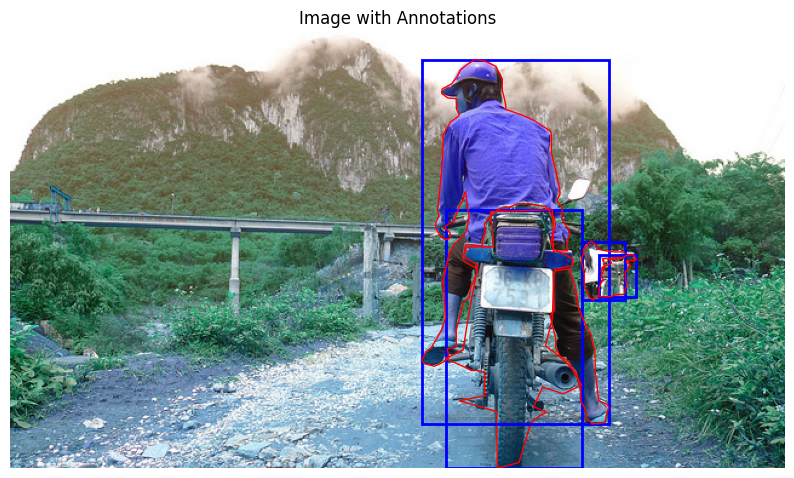

In [15]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cv2

# Get the annotation information of the image
ann_ids = coco.getAnnIds(imgIds=image_sample['id'], iscrowd=None)
anns = coco.loadAnns(ann_ids)

# Create a plotting window
plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.axis('off')
plt.title('Image with Annotations')

# Draw bounding boxes and segmentation masks
for ann in anns:
    # Draw bounding box
    bbox = ann['bbox']
    rect = patches.Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=2, edgecolor='b', facecolor='none')
    plt.gca().add_patch(rect)
    
    # Draw segmentation mask
    if 'segmentation' in ann:
        for seg in ann['segmentation']:
            poly = np.array(seg).reshape((int(len(seg)/2), 2))
            plt.gca().add_patch(patches.Polygon(poly, linewidth=1, edgecolor='r', facecolor='none'))

plt.show()

To analyze the annotation features, especially those about size, let us delve into the EDA.


In [16]:
def calculate_brightness(image):
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    brightness = hsv[:, :, 2]
    return brightness

def calculate_saturation(image):
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    saturation = hsv[:, :, 1]
    return saturation

def calculate_contrast(image):
    lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
    l_channel, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    contrast = clahe.apply(l_channel)
    return contrast


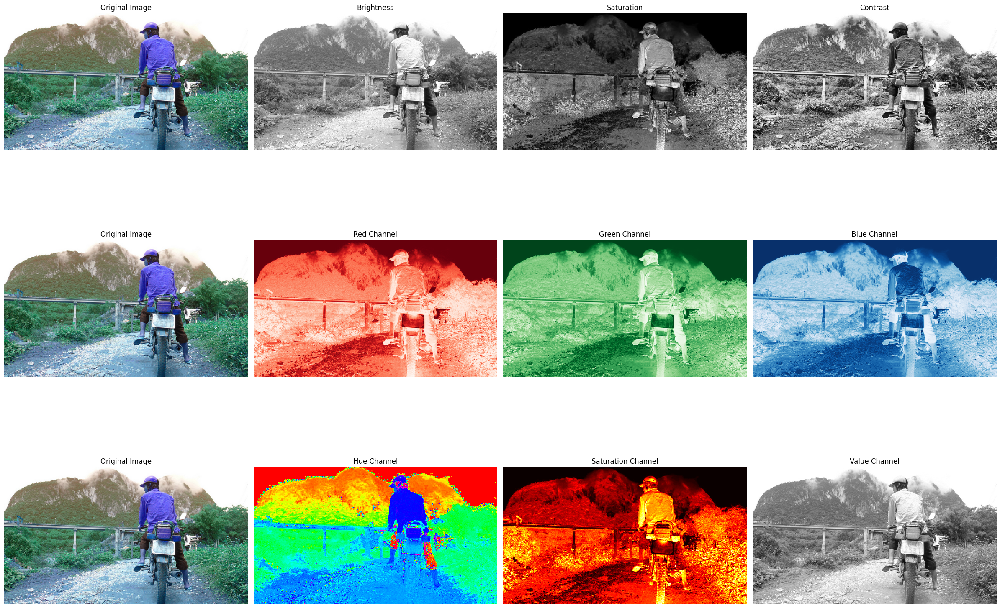

In [17]:
def channels(image):
    brightness = calculate_brightness(image)
    saturation = calculate_saturation(image)
    contrast = calculate_contrast(image)
            
    # RGB
    R, G, B = cv2.split(image)
    
    # HSV
    hsv_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    H, S, V = cv2.split(hsv_image)
    
    return brightness, saturation, contrast, R, G, B, H, S, V

def plot(image):
    brightness, saturation, contrast, R, G, B, H, S, V = channels(image)
    fig, axes = plt.subplots(3, 4, figsize=(24, 18))
    
    
    axes[0, 0].imshow(image)
    axes[0, 0].set_title('Original Image')
    axes[0, 0].axis('off')
    
    axes[0, 1].imshow(brightness, cmap='gray')
    axes[0, 1].set_title('Brightness')
    axes[0, 1].axis('off')
    
    axes[0, 2].imshow(saturation, cmap='gray')
    axes[0, 2].set_title('Saturation')
    axes[0, 2].axis('off')
    
    axes[0, 3].imshow(contrast, cmap='gray')
    axes[0, 3].set_title('Contrast')
    axes[0, 3].axis('off')
    
    # RGB
    axes[1, 0].imshow(image)
    axes[1, 0].set_title('Original Image')
    axes[1, 0].axis('off')
    
    axes[1, 1].imshow(R, cmap='Reds')
    axes[1, 1].set_title('Red Channel')
    axes[1, 1].axis('off')
    
    axes[1, 2].imshow(G, cmap='Greens')
    axes[1, 2].set_title('Green Channel')
    axes[1, 2].axis('off')
    
    axes[1, 3].imshow(B, cmap='Blues')
    axes[1, 3].set_title('Blue Channel')
    axes[1, 3].axis('off')
    
    
    # HSV
    axes[2, 0].imshow(image)
    axes[2, 0].set_title('Original Image')
    axes[2, 0].axis('off')
    
    axes[2, 1].imshow(H, cmap='hsv')
    axes[2, 1].set_title('Hue Channel')
    axes[2, 1].axis('off')
    
    axes[2, 2].imshow(S, cmap='hot')
    axes[2, 2].set_title('Saturation Channel')
    axes[2, 2].axis('off')
    
    axes[2, 3].imshow(V, cmap='gray')
    axes[2, 3].set_title('Value Channel')
    axes[2, 3].axis('off')
    
    
    
    plt.tight_layout()
    plt.show()
    
plot(image)

## 3. Perform Analysis of unsupervised models
Based on plots above, we may learn that different channel may have different performance in image extraction and let me do some further experiment.
First, I choose a sample image to implement the model of kmeans and SCIL.
# 3.1 Sample experiment
Let us pick a single example to analyze, using the two unsupervised method, Kmeans and SCIL.


Here is an introduction:
SCIL (Simple Linear Iterative Clustering) and K-means are both clustering algorithms used extensively in image segmentation and data clustering tasks. Here are their similarities and differences concisely explained:

1) Similarities:
Purpose: Both SCIL and K-means are used for partitioning a dataset into clusters, which can be especially useful in segmenting images into meaningful regions.
Iterative: Each algorithm iteratively assigns data points (or pixels, in the case of images) to clusters until a stopping criterion is met, usually based on minimal change in cluster centroids or a maximum number of iterations.

2) Differences:
Algorithmic Approach:
K-means aims to minimize the variance within each cluster. In each iteration, it assigns each data point to the nearest cluster centroid and recalculates the centroids based on the current cluster memberships.
SCIL operates in the image domain and aims to group pixels into superpixels based on color similarity and proximity in the image grid. SCIL adapts a local clustering technique with connectivity constraints, which helps in preserving image boundaries more effectively than K-means.

3) Application:
K-means is a general-purpose clustering algorithm used across various domains of data analysis but can struggle with non-globular clusters and varying densities.
SCIL is specifically tailored for image data, emphasizing maintaining the coherence of image regions and effectively managing the compactness and uniformity of superpixels.
In summary, while K-means is a versatile algorithm suitable for a broad range of clustering tasks, SCIL is designed specifically for image segmentation, providing an advantage in scenarios where image-specific characteristics like edge preservation are crucial.


In [18]:
from skimage import segmentation, color

def calculate_iou(mask1, mask2):
    intersection = np.logical_and(mask1, mask2)
    union = np.logical_or(mask1, mask2)
    iou = np.sum(intersection) / np.sum(union)
    return iou

def segment_image_kmeans(image, n_clusters=10):
    if len(image.shape) == 2:
        # For a single-channel image, add a new dimension to match the requirements of the k-means function
        pixels = image.reshape((-1, 1))
    else:
        # For multi-channel images, keep it as is
        pixels = image.reshape((-1, 3))
        
    kmeans = cv2.kmeans(pixels.astype(np.float32), n_clusters, None, 
                        (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2), 
                        10, cv2.KMEANS_RANDOM_CENTERS)
    _, labels, _ = kmeans
    segmented_image = labels.reshape(image.shape[:2])
    return segmented_image

def segment_image_scil(image, n_segments=10):
    if len(image.shape) == 2:
        # Convert single-channel image to a three-channel image by duplicating the single channel three times
        image = np.stack([image] * 3, axis=-1)
        
    labels = segmentation.slic(image, n_segments=n_segments, compactness=10, sigma=1)
    return labels


Max IOU for K-means: 0.3513780221329386
Max IOU for SCIL: 0.42075442409189695


<Figure size 1200x500 with 0 Axes>

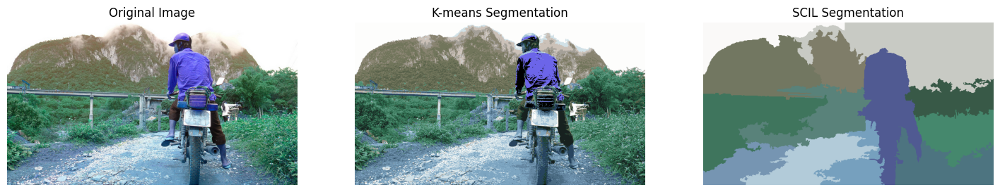

In [19]:
# Image segmentation
def display_images(original_image, kmeans_labels, scil_labels):
    """Display the original image and segmentation results."""
    plt.figure(figsize=(18, 6))  # Increase the figure size to accommodate three images
    
    # Display the original image
    plt.subplot(1, 3, 1)
    if len(original_image.shape) == 2:  # Check if it's a single-channel image
        plt.imshow(original_image, cmap='gray')  # Display single-channel images in grayscale
    else:
        plt.imshow(original_image)  # Display multi-channel images normally
    plt.title('Original Image')
    plt.axis('off')
    
    # Display K-means segmentation result
    plt.subplot(1, 3, 2)
    if len(original_image.shape) == 2:
        # Use color mapping for single-channel images
        kmeans_image = color.label2rgb(kmeans_labels, original_image, kind='avg', bg_label=0)
        plt.imshow(kmeans_image, cmap='gray')
    else:
        plt.imshow(color.label2rgb(kmeans_labels, original_image, kind='avg'))
    plt.title('K-means Segmentation')
    plt.axis('off')
    
    # Display SCIL segmentation result
    plt.subplot(1, 3, 3)
    if len(original_image.shape) == 2:
        # Use color mapping for single-channel images
        scil_image = color.label2rgb(scil_labels, original_image, kind='avg', bg_label=0)
        plt.imshow(scil_image, cmap='gray')
    else:
        plt.imshow(color.label2rgb(scil_labels, original_image, kind='avg'))
    plt.title('SCIL Segmentation')
    plt.axis('off')
    
    plt.show()

# Example call
def comparison_kmeans_SCIL(image, n_clusters=20):
    original_image = image.copy()
    kmeans_labels = segment_image_kmeans(image, n_clusters=n_clusters)
    scil_labels = segment_image_scil(image, n_segments=n_clusters)
    
    # Retrieve annotations and calculate IOU
    ann_ids = coco.getAnnIds(imgIds=image_sample['id'], iscrowd=None)
    anns = coco.loadAnns(ann_ids)
    max_iou_kmeans = 0
    max_iou_scil = 0
    
    for ann in anns:
        mask_true = coco.annToMask(ann)
        mask_kmeans = (kmeans_labels == np.argmax(np.bincount(kmeans_labels.flatten()[mask_true.flatten() == 1])))
        mask_scil = (scil_labels == np.argmax(np.bincount(scil_labels.flatten()[mask_true.flatten() == 1])))
        iou_kmeans = calculate_iou(mask_true, mask_kmeans)
        iou_scil = calculate_iou(mask_true, mask_scil)
        max_iou_kmeans = max(max_iou_kmeans, iou_kmeans)
        max_iou_scil = max(max_iou_scil, iou_scil)
    
    # Print results
    print(f"Max IOU for K-means: {max_iou_kmeans}")
    print(f"Max IOU for SCIL: {max_iou_scil}")
    
    # Visualize segmentation results
    plt.figure(figsize=(12, 5))
    
    display_images(original_image, kmeans_labels, scil_labels)
    
comparison_kmeans_SCIL(image)


The performance seems OK, we learn that the SCIL segmentation algorithm seems successfully extract object in the image.
# 3.2 Parameter Analysis
Since we learn that the two method have their own potiential in image division, let us explore which parameter of segment number is more suitable.

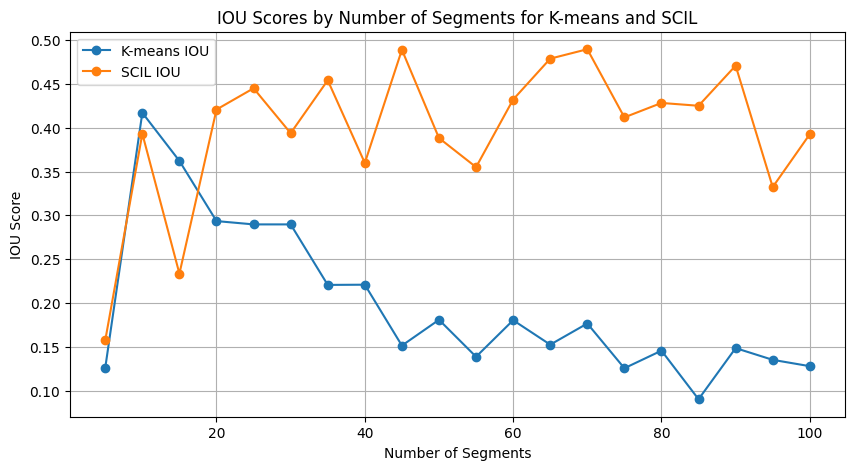

In [20]:
def parameter_explore(image, n_segments_range=range(5, 101, 5)):
    # Record the IOU for each setting
    iou_scores_kmeans = []
    iou_scores_scil = []
    
    for n_segments in n_segments_range:
        # Segment the image
        kmeans_labels = segment_image_kmeans(image, n_clusters=n_segments)
        scil_labels = segment_image_scil(image, n_segments=n_segments)
    
        # Calculate maximum IOU
        ann_ids = coco.getAnnIds(imgIds=image_sample['id'], iscrowd=None)
        anns = coco.loadAnns(ann_ids)
        max_iou_kmeans = 0
        max_iou_scil = 0
    
        for ann in anns:
            mask_true = coco.annToMask(ann)
            mask_kmeans = (kmeans_labels == np.argmax(np.bincount(kmeans_labels.flatten()[mask_true.flatten() == 1])))
            mask_scil = (scil_labels == np.argmax(np.bincount(scil_labels.flatten()[mask_true.flatten() == 1])))
            
            iou_kmeans = calculate_iou(mask_true, mask_kmeans)
            iou_scil = calculate_iou(mask_true, mask_scil)
            
            max_iou_kmeans = max(max_iou_kmeans, iou_kmeans)
            max_iou_scil = max(max_iou_scil, iou_scil)
    
        # Record IOU scores
        iou_scores_kmeans.append(max_iou_kmeans)
        iou_scores_scil.append(max_iou_scil)
    return iou_scores_kmeans, iou_scores_scil
    # Plot the IOU variation graph

n_segments_range = range(5, 101, 5)
iou_scores_kmeans, iou_scores_scil = parameter_explore(image, n_segments_range=n_segments_range)

plt.figure(figsize=(10, 5))
plt.plot(n_segments_range, iou_scores_kmeans, label='K-means IOU', marker='o')
plt.plot(n_segments_range, iou_scores_scil, label='SCIL IOU', marker='o')
plt.xlabel('Number of Segments')
plt.ylabel('IOU Score')
plt.title('IOU Scores by Number of Segments for K-means and SCIL')
plt.legend()
plt.grid(True)
plt.show()


It seems SCIL algorithm remains stability because when the parameter of n_segments is too large, the performance is nearly unchanged.
Next, I would pass single channel to SCIL and Kmeans model and with the n_segments of 10 to explore their performance.

# 3.3 Performance analysis and discussion
Since we learn that the two method have their own potiential in image division, let us explore which parameter of segment number is more suitable.

This is for brightness channel comparison in performance of different models:
Max IOU for K-means: 0.08420809781981774
Max IOU for SCIL: 0.1819195696385226


<Figure size 1200x500 with 0 Axes>

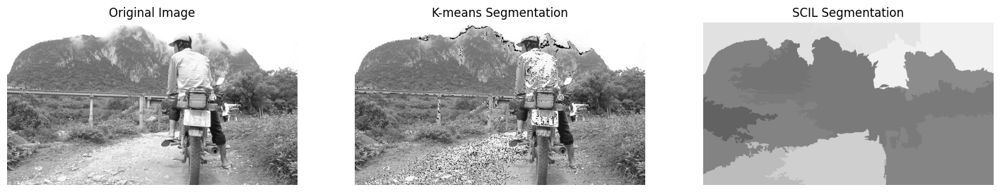

This is for saturation channel comparison in performance of different models:
Max IOU for K-means: 0.10079800498753118
Max IOU for SCIL: 0.3492864041206138


<Figure size 1200x500 with 0 Axes>

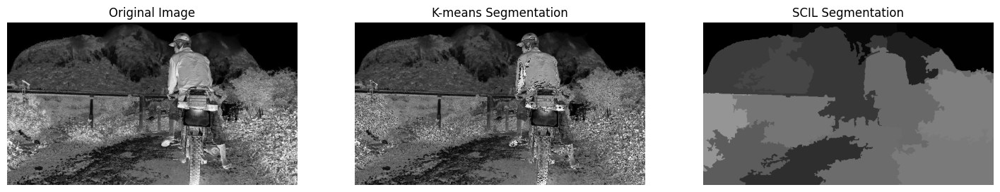

This is for contrast channel comparison in performance of different models:
Max IOU for K-means: 0.09309882401485454
Max IOU for SCIL: 0.2061460399816878


<Figure size 1200x500 with 0 Axes>

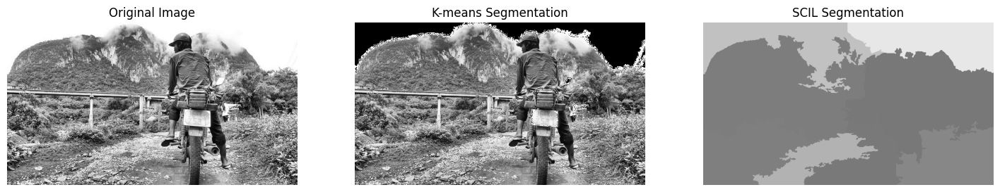

This is for R channel comparison in performance of different models:
Max IOU for K-means: 0.05201227322827609
Max IOU for SCIL: 0.2260801020982696


<Figure size 1200x500 with 0 Axes>

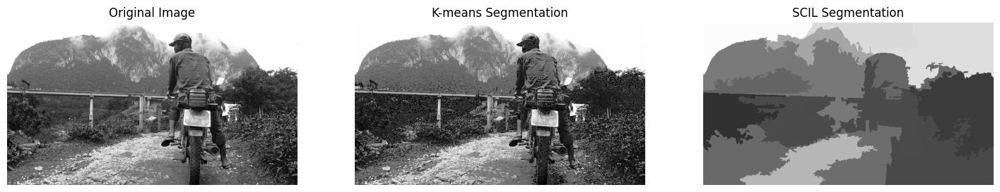

This is for G channel comparison in performance of different models:
Max IOU for K-means: 0.17024070021881837
Max IOU for SCIL: 0.29198262344806314


<Figure size 1200x500 with 0 Axes>

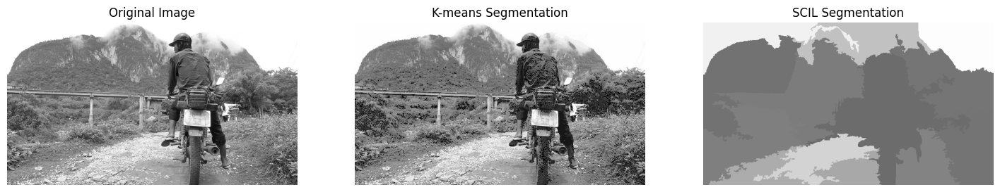

This is for B channel comparison in performance of different models:
Max IOU for K-means: 0.08672086720867209
Max IOU for SCIL: 0.3350813356164384


<Figure size 1200x500 with 0 Axes>

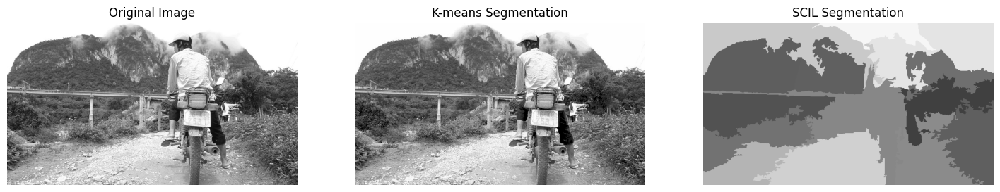

This is for H channel comparison in performance of different models:
Max IOU for K-means: 0.49270310192023636
Max IOU for SCIL: 0.556144004760488


<Figure size 1200x500 with 0 Axes>

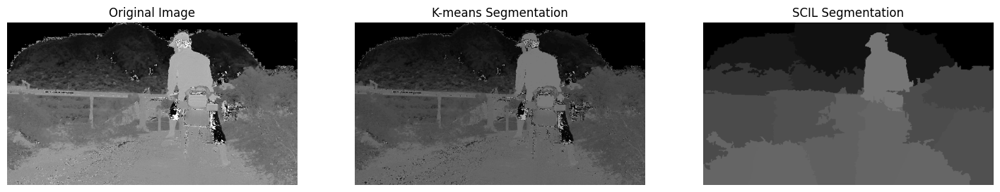

This is for S channel comparison in performance of different models:
Max IOU for K-means: 0.14046507451966242
Max IOU for SCIL: 0.3492864041206138


<Figure size 1200x500 with 0 Axes>

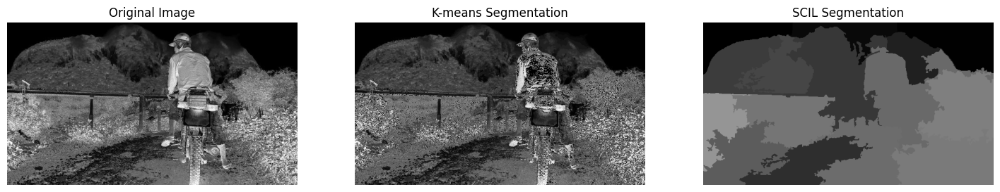

This is for V channel comparison in performance of different models:
Max IOU for K-means: 0.07995753478236577
Max IOU for SCIL: 0.1819195696385226


<Figure size 1200x500 with 0 Axes>

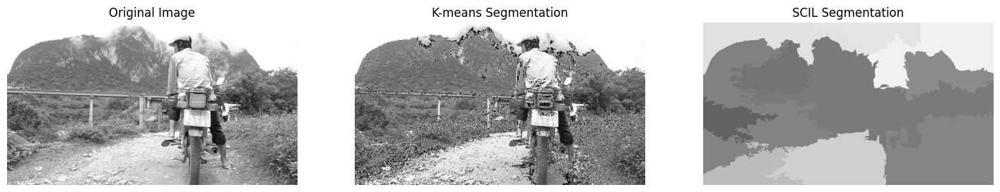

In [21]:
channel_group = channels(image)
channel_name = ['brightness', 'saturation', 'contrast', 'R', 'G', 'B', 'H', 'S', 'V']
for i in range(len(channel_name)):
    print(f'This is for {channel_name[i]} channel comparison in performance of different models:')
    comparison_kmeans_SCIL(channel_group[i])

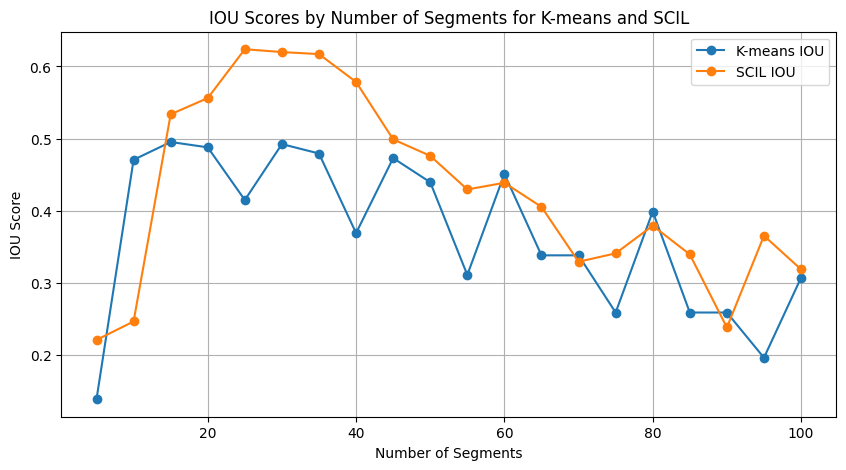

In [24]:
iou_scores_kmeans, iou_scores_scil = parameter_explore(channel_group[channel_name.index('H')],n_segments_range=n_segments_range)

plt.figure(figsize=(10, 5))
plt.plot(n_segments_range, iou_scores_kmeans, label='K-means IOU', marker='o')
plt.plot(n_segments_range, iou_scores_scil, label='SCIL IOU', marker='o')
plt.xlabel('Number of Segments')
plt.ylabel('IOU Score')
plt.title('IOU Scores by Number of Segments for K-means and SCIL')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
# Display a sample image
n_segments_range = range(5, 101, 5)
iou_scores_kmeans_group = []
iou_scores_scil_group = []

image_ids = coco.getImgIds()
images = coco.loadImgs(image_ids)

for i in range(24):
    
    image_sample = images[i]
    image_path = 'data/train2017/' + image_sample['file_name']
    image = cv2.imread(image_path)
    
    
    iou_scores_kmeans, iou_scores_scil = parameter_explore(image, n_segments_range=n_segments_range)
    iou_scores_kmeans_group.append(iou_scores_kmeans)
    iou_scores_scil_group.append(iou_scores_scil)
  

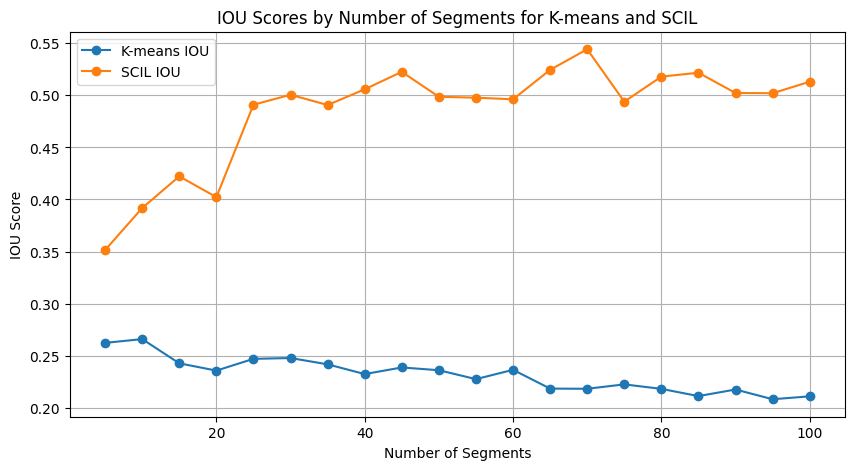

In [72]:
  
average_kmeans = [sum(values) / len(values) for values in zip(*iou_scores_kmeans_group)]
average_scil = [sum(values) / len(values) for values in zip(*iou_scores_scil_group)]
    
plt.figure(figsize=(10, 5))
plt.plot(n_segments_range, average_kmeans, label='K-means IOU', marker='o')
plt.plot(n_segments_range, average_scil, label='SCIL IOU', marker='o')
plt.xlabel('Number of Segments')
plt.ylabel('IOU Score')
plt.title('IOU Scores by Number of Segments for K-means and SCIL')
plt.legend()
plt.grid(True)
plt.show()




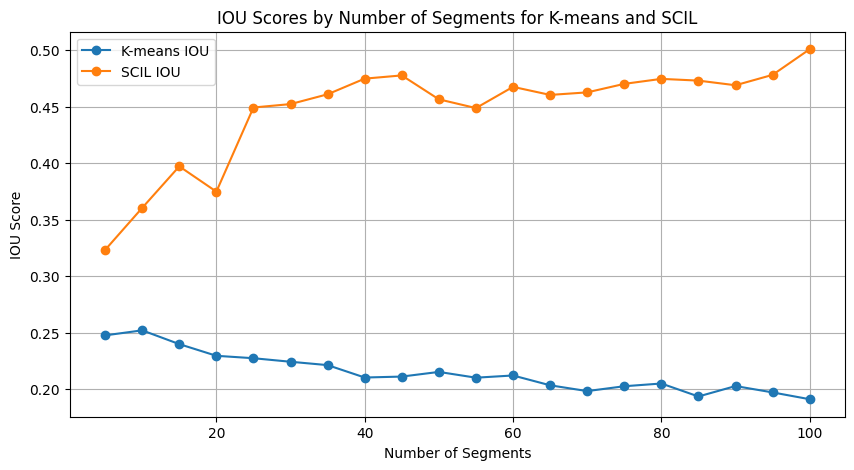

In [73]:
for i in range(24):
    
    image_sample = images[i]
    image_path = 'data/train2017/' + image_sample['file_name']
    image = cv2.imread(image_path)
    hsv_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    H, S, V = cv2.split(hsv_image)
    
    iou_scores_kmeans, iou_scores_scil = parameter_explore(H, n_segments_range=n_segments_range)
    iou_scores_kmeans_group.append(iou_scores_kmeans)
    iou_scores_scil_group.append(iou_scores_scil)
    
average_kmeans = [sum(values) / len(values) for values in zip(*iou_scores_kmeans_group)]
average_scil = [sum(values) / len(values) for values in zip(*iou_scores_scil_group)]
    
plt.figure(figsize=(10, 5))
plt.plot(n_segments_range, average_kmeans, label='K-means IOU', marker='o')
plt.plot(n_segments_range, average_scil, label='SCIL IOU', marker='o')
plt.xlabel('Number of Segments')
plt.ylabel('IOU Score')
plt.title('IOU Scores by Number of Segments for K-means and SCIL')
plt.legend()
plt.grid(True)
plt.show()

Surprisingly, the performance using H channel runs a little weaker than the origin graph. This may because not each image are distinct in object and its background.
In the field of image identification, segmentation is a crucial step for further implementation, such as HOG feature, color histogram, and other feature vectors, to train a supervised model and predict the segmentation from unsupervised models, but this is out of the scope of this project.

## 4. References
**Books and Articles:**

- Gonzalez, R.C., & Woods, R.E. (2018). *Digital Image Processing* (4th ed.). Pearson.
- Jähne, B. (2005). *Digital Image Processing* (6th ed.). Springer.
- MacQueen, J. (1967). Some Methods for classification and Analysis of Multivariate Observations. *Proceedings of 5th Berkeley Symposium on Mathematical Statistics and Probability*, 1, 281-297.
- Achanta, R., Shaji, A., Smith, K., Lucchi, A., Fua, P., & Süsstrunk, S. (2012). SLIC Superpixels Compared to State-of-the-Art Superpixel Methods. *IEEE Transactions on Pattern Analysis and Machine Intelligence*, 34(11), 2274-2282.
- H. Caesar, J. Uijlings, V. Ferrari, COCO-Stuff: Thing and Stuff Classes in Context. In Computer Vision and Pattern Recognition (CVPR), 2018. 


**Online Resources:**

- OpenCV Documentation. Available at: [OpenCV Official Documentation](https://docs.opencv.org/master/)
- Scikit-image Documentation. Available at: [Scikit-image Official Documentation](https://scikit-image.org/docs/stable/)
